In [1]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 15.0 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import yaml
import shutil


source_path = '/kaggle/input/shark-without-human-with-high-augmentation-dataset/data.yaml'  
destination_path = '/kaggle/working/data.yaml'          

shutil.copy(source_path, destination_path)


with open(destination_path, 'r') as file:
    data = yaml.safe_load(file)

print("Original YAML content:")
print(data)



Original YAML content:
{'train': '../train/images', 'val': '../valid/images', 'test': '../test/images', 'nc': 1, 'names': ['shark'], 'roboflow': {'workspace': 'rahma-2csx6', 'project': 'shark-without-human-dataset', 'version': 4, 'license': 'Private', 'url': 'https://universe.roboflow.com/rahma-2csx6/shark-without-human-dataset/dataset/4'}}


In [ ]:

data['train'] = '/kaggle/input/shark-without-human-with-high-augmentation-dataset/train/images'  
data['val'] = '/kaggle/input/shark-without-human-with-high-augmentation-dataset/valid/images'      
data['test'] = '/kaggle/input/shark-without-human-with-high-augmentation-dataset/test/images'    

In [ ]:

with open(destination_path, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

print(f"Modified YAML saved at: {destination_path}")

Modified YAML saved at: /kaggle/working/data.yaml


In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11m.pt") 

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 38.8M/38.8M [00:00<00:00, 227MB/s]


In [ ]:
import torch
torch.cuda.empty_cache()

model.train(
    data='/kaggle/working/data.yaml',
    epochs=30,                    
    batch=16,                      
    imgsz=640,
    workers=4,
    optimizer='Adam',
    weight_decay=0.005,           
    lr0=0.0001,                  
    patience=5,                  
    label_smoothing=0.1,          
    augment=True,                 
    save_period=2,
    dropout=0.3,                  
    warmup_epochs=3,
    val=True,
    cos_lr=True
)


WARNING ⚠️ 'label_smoothing' is deprecated and will be removed in in the future.
Ultralytics 8.3.132 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.3, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=5e-05, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=

100%|██████████| 755k/755k [00:00<00:00, 17.9MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 75.7MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.3±0.2 ms, read: 11.5±3.6 MB/s, size: 76.5 KB)


train: Scanning /kaggle/input/shark-without-human-with-high-augmentation-dataset/train/labels... 8973 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8973/8973 [00:49<00:00, 182.25it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/shark-without-human-with-high-augmentation-dataset/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 9.9±5.7 MB/s, size: 79.4 KB)


val: Scanning /kaggle/input/shark-without-human-with-high-augmentation-dataset/valid/labels... 832 images, 0 backgrounds, 0 corrupt: 100%|██████████| 832/832 [00:04<00:00, 196.13it/s]


WARNING ⚠️ val: Cache directory /kaggle/input/shark-without-human-with-high-augmentation-dataset/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: Adam(lr=5e-05, momentum=0.937) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.005), 112 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30         8G      1.478      1.152      1.309         16        640: 100%|██████████| 561/561 [07:07<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:13<00:00,  1.92it/s]

                   all        832       1023      0.861      0.668      0.794       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      8.27G       1.34     0.8822      1.241         28        640: 100%|██████████| 561/561 [07:01<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.09it/s]

                   all        832       1023      0.905      0.813       0.89      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      8.18G      1.279     0.8079      1.213         22        640: 100%|██████████| 561/561 [06:59<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.09it/s]

                   all        832       1023      0.909       0.78      0.884      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      8.06G      1.248     0.7652      1.195         24        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.10it/s]

                   all        832       1023      0.894      0.832      0.896      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      8.17G      1.242     0.7274       1.19         21        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.11it/s]

                   all        832       1023      0.931      0.842      0.922      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      8.17G      1.217     0.7201      1.184         27        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.11it/s]

                   all        832       1023       0.92      0.839      0.909      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30         8G      1.178     0.6843      1.165         15        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.10it/s]

                   all        832       1023      0.911      0.841      0.919      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      8.05G      1.183     0.6666      1.168         18        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.10it/s]

                   all        832       1023        0.9      0.859      0.916      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      8.04G      1.163     0.6572      1.159         17        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.10it/s]

                   all        832       1023      0.923      0.834      0.902      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      8.19G      1.149     0.6423      1.145         21        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.09it/s]

                   all        832       1023      0.919      0.852      0.923      0.657



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      7.99G       1.12     0.6228      1.137         18        640: 100%|██████████| 561/561 [06:57<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.11it/s]

                   all        832       1023      0.929      0.841      0.909      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      8.04G      1.127     0.6099      1.139         22        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.11it/s]

                   all        832       1023      0.899      0.863      0.927      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      8.06G      1.111     0.5914      1.135         25        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.09it/s]

                   all        832       1023      0.923      0.867      0.938      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      8.03G      1.101     0.5875      1.126         33        640: 100%|██████████| 561/561 [06:57<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.10it/s]

                   all        832       1023      0.935      0.871      0.936      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      7.99G      1.084     0.5821      1.116         22        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.11it/s]

                   all        832       1023       0.93      0.849      0.932      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      8.05G      1.076     0.5666       1.11         18        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.11it/s]

                   all        832       1023      0.959      0.838      0.939      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      8.17G       1.07     0.5598      1.108         17        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.11it/s]

                   all        832       1023      0.952      0.854      0.927      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      8.18G      1.063     0.5446      1.108         17        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.11it/s]

                   all        832       1023      0.936      0.844      0.926      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      7.99G       1.03     0.5268       1.09         25        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.11it/s]

                   all        832       1023      0.934      0.853      0.928      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30       8.1G       1.03     0.5289      1.087         24        640: 100%|██████████| 561/561 [06:57<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.11it/s]

                   all        832       1023      0.944       0.85      0.937      0.705


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      8.04G     0.9923     0.4386      1.079         13        640: 100%|██████████| 561/561 [06:59<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.10it/s]

                   all        832       1023      0.938      0.861      0.937      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      8.17G     0.9694     0.4259      1.065         13        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.10it/s]

                   all        832       1023      0.925      0.903      0.943      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      7.99G     0.9474     0.4106      1.054         17        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.10it/s]

                   all        832       1023      0.946      0.865       0.94      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      8.04G     0.9317     0.4052       1.05         14        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.10it/s]

                   all        832       1023      0.946      0.857      0.935      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      8.04G     0.9312     0.4013      1.049         14        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.09it/s]

                   all        832       1023      0.951      0.869       0.94       0.72



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      8.31G     0.9128     0.3924      1.041         15        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.09it/s]

                   all        832       1023      0.946      0.868      0.941      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      7.99G     0.9086     0.3902      1.041         18        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.10it/s]

                   all        832       1023      0.948       0.87      0.942      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      8.04G     0.8983     0.3852      1.031         13        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.11it/s]

                   all        832       1023       0.95      0.866      0.939      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      8.04G      0.895     0.3832      1.027         15        640: 100%|██████████| 561/561 [06:58<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.10it/s]

                   all        832       1023      0.949      0.871      0.941      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      8.31G     0.8961     0.3811      1.031         16        640: 100%|██████████| 561/561 [06:59<00:00,  1.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:12<00:00,  2.10it/s]

                   all        832       1023      0.949      0.874      0.943       0.73



30 epochs completed in 3.606 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 40.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 40.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.132 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:26<00:00,  1.03s/it]


                   all        832       1023      0.927      0.873      0.938      0.722


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 28.5ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bdc976338b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:

metrics = model.val()

Ultralytics 8.3.132 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 76.6±36.1 MB/s, size: 44.6 KB)


val: Scanning /kaggle/input/shark-without-human-with-high-augmentation-dataset/valid/labels... 832 images, 0 backgrounds, 0 corrupt: 100%|██████████| 832/832 [00:01<00:00, 702.30it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/shark-without-human-with-high-augmentation-dataset/valid is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 52/52 [00:28<00:00,  1.82it/s]


                   all        832       1023      0.932      0.874      0.938      0.723


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.5ms preprocess, 30.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train2


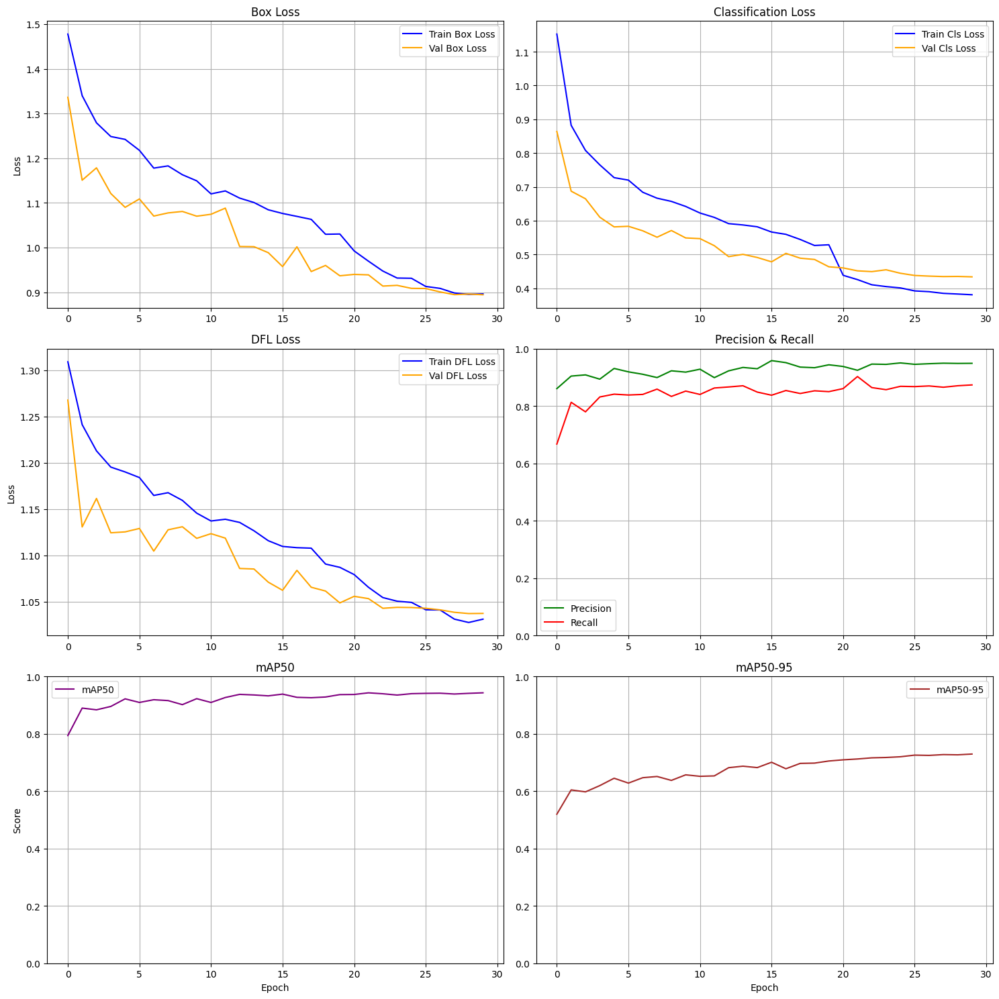

In [ ]:
import os
import matplotlib.pyplot as plt
import pandas as pd

def plot_combined_metrics(results_dir='runs/detect/train'):
    results_file = None
    for f in ['results.csv', 'results.txt', 'results.yaml']:
        if os.path.exists(os.path.join(results_dir, f)):
            results_file = os.path.join(results_dir, f)
            break
    
    if not results_file:
        print(f"No results file found in {results_dir}")
        return
    
    if results_file.endswith('.csv'):
        df = pd.read_csv(results_file)
    elif results_file.endswith('.yaml'):
        import yaml
        with open(results_file) as f:
            results = yaml.safe_load(f)
        df = pd.DataFrame(results)
    else:  
        data = []
        with open(results_file) as f:
            for line in f:
                if line.strip():
                    data.append([float(x) for x in line.strip().split()])
        df = pd.DataFrame(data)
    
    fig, axs = plt.subplots(3, 2, figsize=(15, 15))
    
    axs[0,0].plot(df['train/box_loss'], label='Train Box Loss', color='blue')
    axs[0,0].plot(df['val/box_loss'], label='Val Box Loss', color='orange')
    axs[0,0].set_title('Box Loss')
    axs[0,0].set_ylabel('Loss')
    axs[0,0].legend()
    axs[0,0].grid(True)
    
    axs[0,1].plot(df['train/cls_loss'], label='Train Cls Loss', color='blue')
    axs[0,1].plot(df['val/cls_loss'], label='Val Cls Loss', color='orange')
    axs[0,1].set_title('Classification Loss')
    axs[0,1].legend()
    axs[0,1].grid(True)
    
    axs[1,0].plot(df['train/dfl_loss'], label='Train DFL Loss', color='blue')
    axs[1,0].plot(df['val/dfl_loss'], label='Val DFL Loss', color='orange')
    axs[1,0].set_title('DFL Loss')
    axs[1,0].set_ylabel('Loss')
    axs[1,0].legend()
    axs[1,0].grid(True)
    
    axs[1,1].plot(df['metrics/precision(B)'], label='Precision', color='green')
    axs[1,1].plot(df['metrics/recall(B)'], label='Recall', color='red')
    axs[1,1].set_title('Precision & Recall')
    axs[1,1].set_ylim(0, 1)
    axs[1,1].legend()
    axs[1,1].grid(True)
    
    axs[2,0].plot(df['metrics/mAP50(B)'], label='mAP50', color='purple')
    axs[2,0].set_title('mAP50')
    axs[2,0].set_ylabel('Score')
    axs[2,0].set_xlabel('Epoch')
    axs[2,0].set_ylim(0, 1)
    axs[2,0].legend()
    axs[2,0].grid(True)
    
    axs[2,1].plot(df['metrics/mAP50-95(B)'], label='mAP50-95', color='brown')
    axs[2,1].set_title('mAP50-95')
    axs[2,1].set_xlabel('Epoch')
    axs[2,1].set_ylim(0, 1)
    axs[2,1].legend()
    axs[2,1].grid(True)
    
    plt.tight_layout()
    plt.savefig('combined_metrics.png')
    plt.show()

plot_combined_metrics()

In [ ]:
from ultralytics import YOLO

fine_tuned_model = YOLO('runs/detect/train/weights/best.pt')

In [11]:

metrics = fine_tuned_model.val(data='/kaggle/working/data.yaml', split='test')

Ultralytics 8.3.132 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11m summary (fused): 125 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 9.0±9.7 MB/s, size: 77.6 KB)


val: Scanning /kaggle/input/shark-without-human-with-high-augmentation-dataset/test/labels... 403 images, 0 backgrounds, 0 corrupt: 100%|██████████| 403/403 [00:02<00:00, 184.12it/s]

WARNING ⚠️ val: Cache directory /kaggle/input/shark-without-human-with-high-augmentation-dataset/test is not writeable, cache not saved.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:07<00:00,  3.44it/s]


                   all        403        478       0.95        0.9      0.957      0.743


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.8ms preprocess, 13.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val


# **Test Video Frames**

In [ ]:
import yaml
import shutil
import os

source_path = '/kaggle/input/all-shark-video-frames-test2-dataset/data.yaml'  
destination_path = '/kaggle/working/test2_data.yaml'  

shutil.copy(source_path, destination_path)

with open(destination_path, 'r') as file:
    data = yaml.safe_load(file)

data['test'] = '/kaggle/input/all-shark-video-frames-test2-dataset/test/images'
data['train'] = '/kaggle/working/dummy/train/images' 
data['val'] = '/kaggle/working/dummy/val/images'     

os.makedirs(data['train'], exist_ok=True)
os.makedirs(data['val'], exist_ok=True)

with open(destination_path, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

print("Modified YAML saved successfully.")


Modified YAML saved successfully.


In [ ]:
metrics = fine_tuned_model.val(data='/kaggle/working/test2_data.yaml', split='test',conf=0.5)

Ultralytics 8.3.132 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 7.4±3.2 MB/s, size: 49.2 KB)


val: Scanning /kaggle/input/all-shark-video-frames-test2-dataset/test/labels... 797 images, 0 backgrounds, 0 corrupt: 100%|██████████| 797/797 [00:04<00:00, 195.73it/s]


WARNING ⚠️ val: Cache directory /kaggle/input/all-shark-video-frames-test2-dataset/test is not writeable, cache not saved.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 50/50 [00:13<00:00,  3.68it/s]


                   all        797        851      0.848      0.816      0.853      0.413


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.5ms preprocess, 13.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/val2


In [15]:
results = fine_tuned_model.predict(source='/kaggle/input/all-shark-video-frames-test2-dataset/test/images', save=True,conf=0.5)



image 1/797 /kaggle/input/all-shark-video-frames-test2-dataset/test/images/Copy-of-20210615_HayleeErinShark1_frame_001_jpg.rf.61f713b6dae31f839efc9d0bafcacb18.jpg: 640x640 (no detections), 16.1ms
image 2/797 /kaggle/input/all-shark-video-frames-test2-dataset/test/images/Copy-of-20210615_HayleeErinShark1_frame_002_jpg.rf.43817d7551984cafcd471e6023082a9e.jpg: 640x640 (no detections), 16.1ms
image 3/797 /kaggle/input/all-shark-video-frames-test2-dataset/test/images/Copy-of-20210615_HayleeErinShark1_frame_003_jpg.rf.5ba3c119fd5fe7ca1de91c0a53014ac3.jpg: 640x640 (no detections), 16.1ms
image 4/797 /kaggle/input/all-shark-video-frames-test2-dataset/test/images/Copy-of-20210615_HayleeErinShark1_frame_004_jpg.rf.e0f006c03e8f0f987d5ea3511fde6463.jpg: 640x640 (no detections), 16.1ms
image 5/797 /kaggle/input/all-shark-video-frames-test2-dataset/test/images/Copy-of-20210615_HayleeErinShark1_frame_005_jpg.rf.d9a727ce56d8790b347be4b263fae9d0.jpg: 640x640 (no detections), 16.0ms
image 6/797 /kaggle

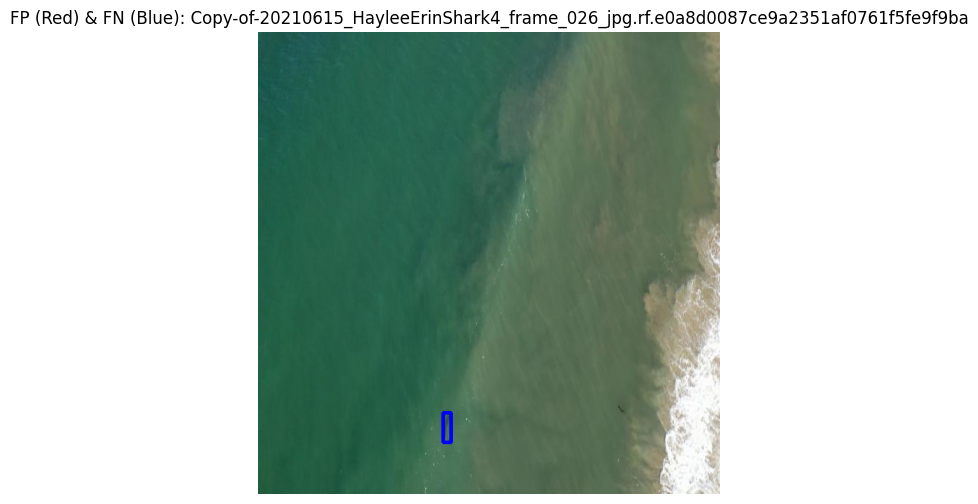

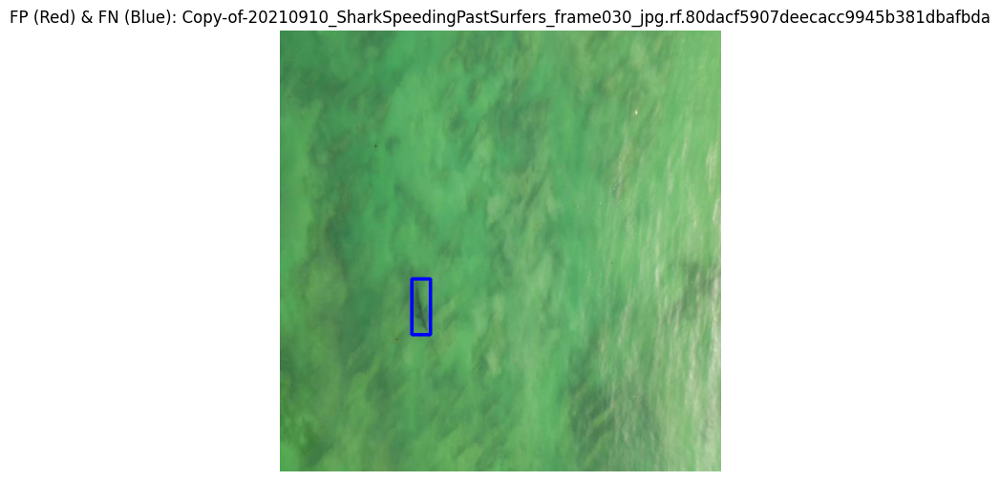

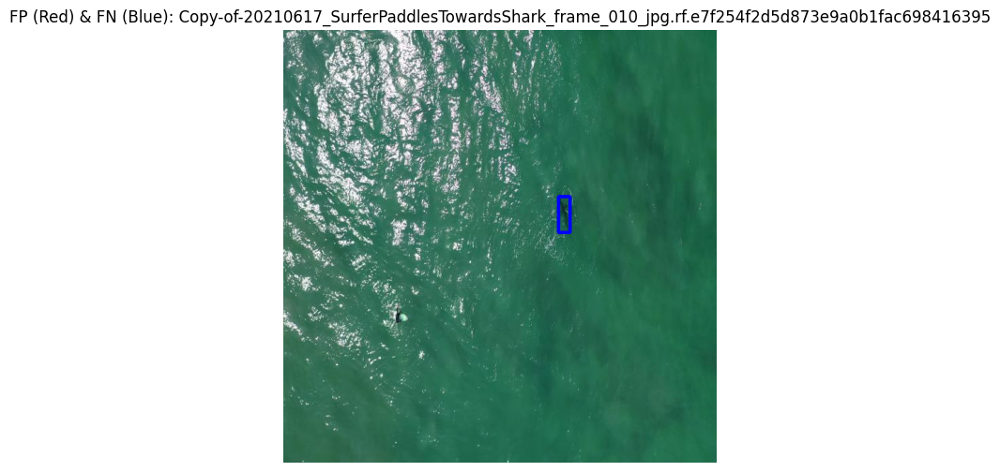

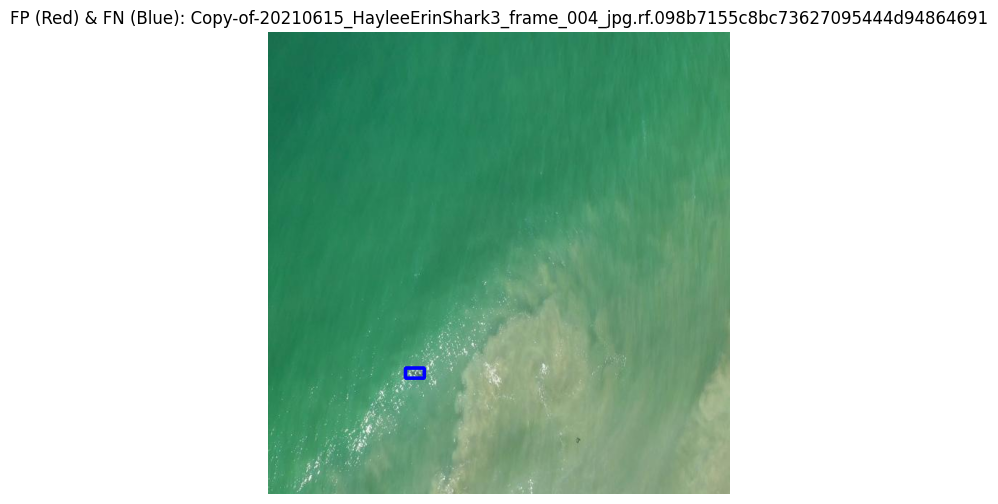

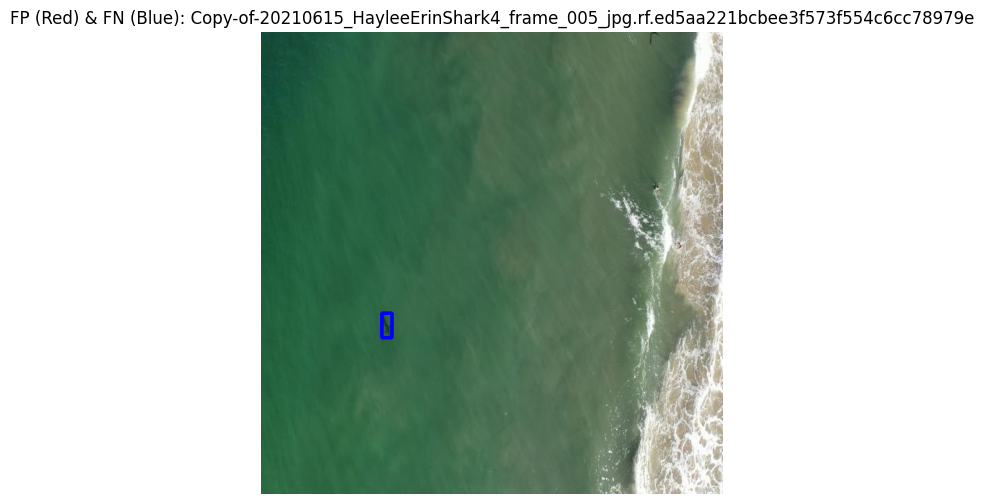

...

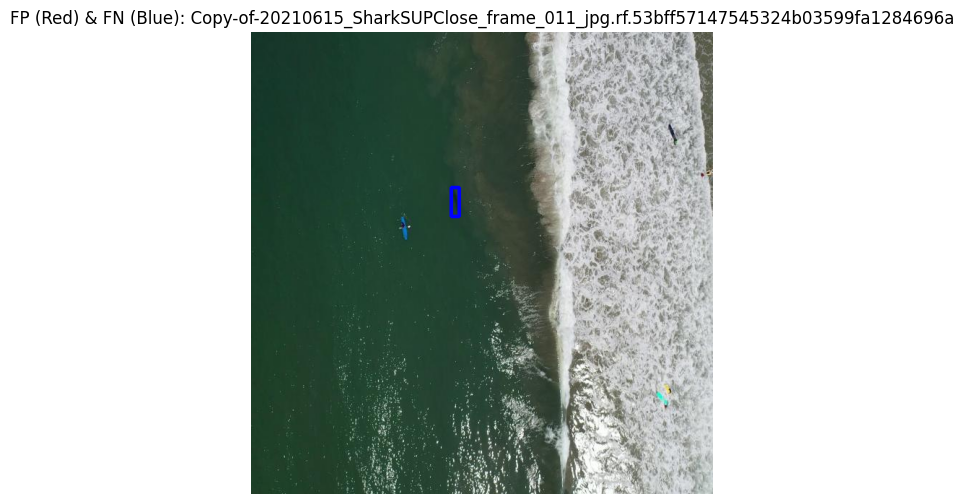

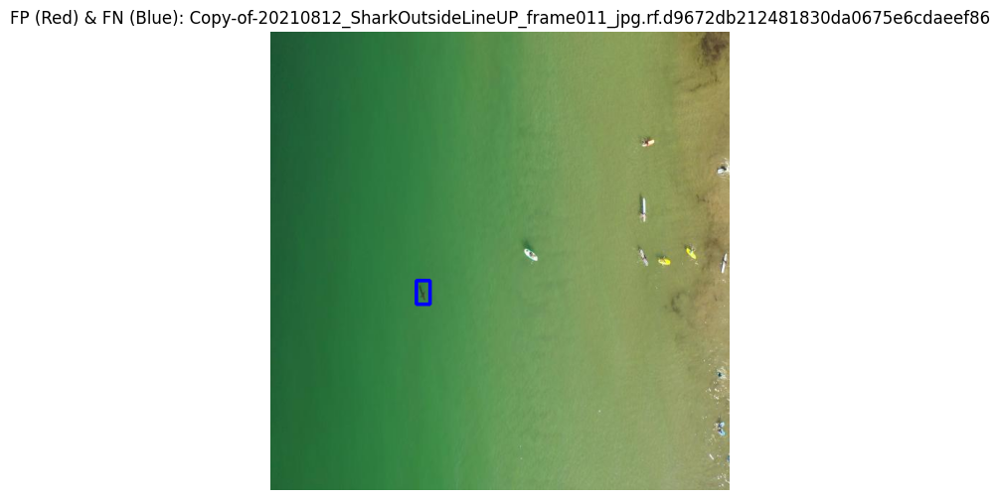

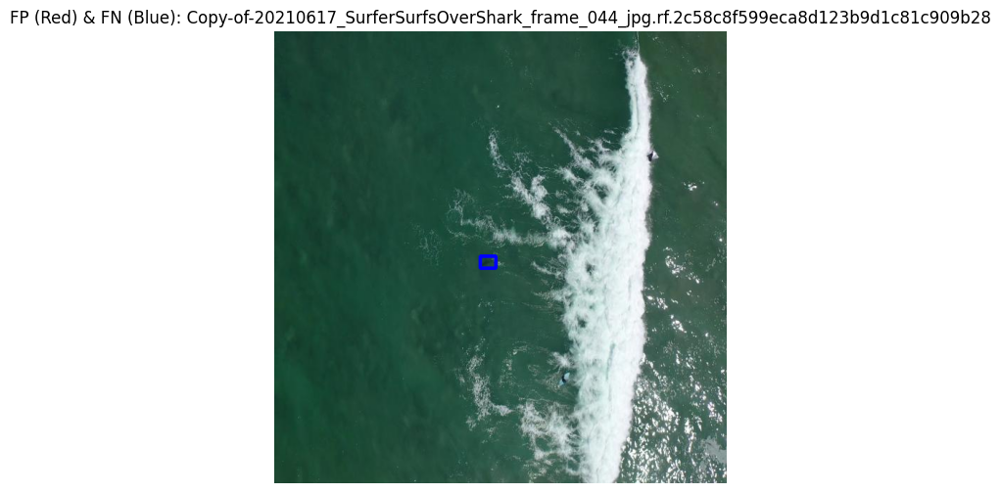

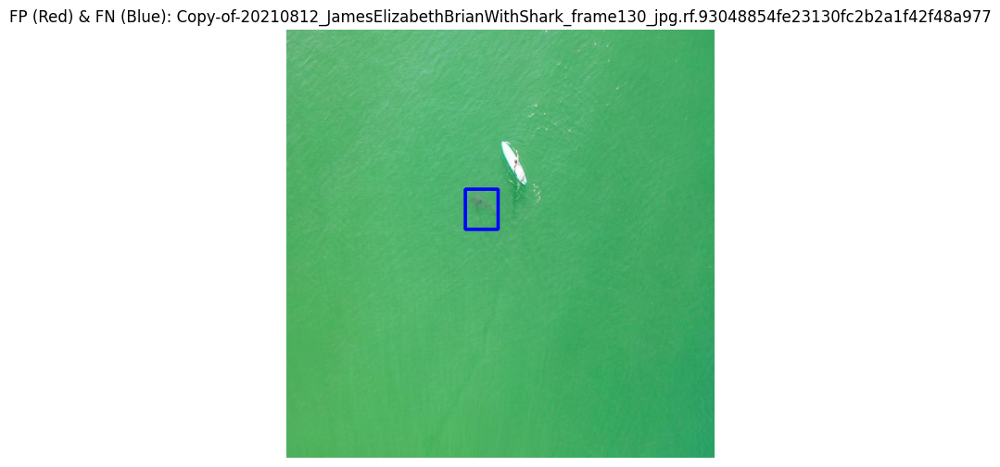

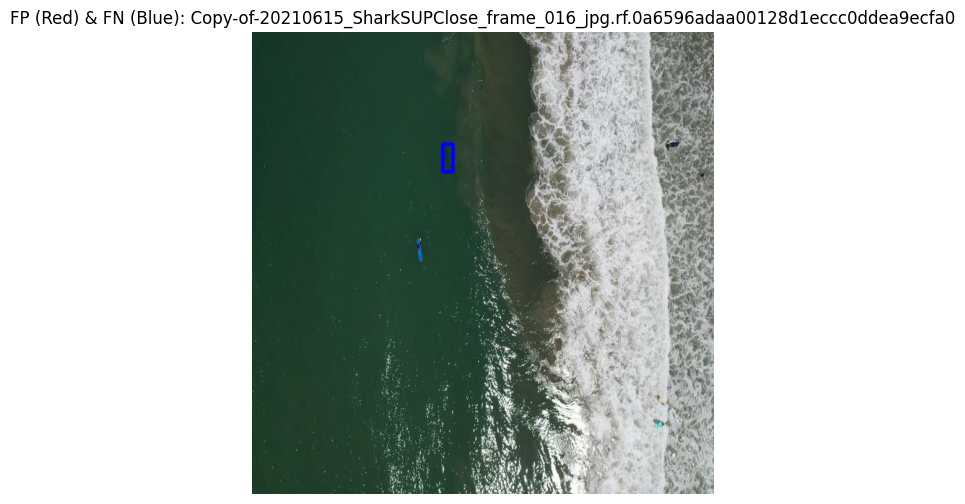

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

output_dir = "runs/detect/predict/labels" 
test_images_dir = "/kaggle/input/all-shark-video-frames-test2-dataset/test/images" 
gt_labels_dir = "/kaggle/input/all-shark-video-frames-test2-dataset/test/labels" 

if not os.path.exists(output_dir):
    print(f"Warning: The directory '{output_dir}' does not exist. No predictions found.")
    pred_files = {}
else:
    pred_files = {f.replace('.txt', ''): os.path.join(output_dir, f) for f in os.listdir(output_dir) if f.endswith('.txt')}

gt_files = {f.replace('.txt', ''): os.path.join(gt_labels_dir, f) for f in os.listdir(gt_labels_dir) if f.endswith('.txt')}

def yolo_to_bbox(box, img_w, img_h):
    x_center, y_center, w, h = box[:4]  
    x1 = int((x_center - w / 2) * img_w)
    y1 = int((y_center - h / 2) * img_h)
    x2 = int((x_center + w / 2) * img_w)
    y2 = int((y_center + h / 2) * img_h)
    return (x1, y1, x2, y2)

for img_name in gt_files.keys():
    img_path = os.path.join(test_images_dir, img_name + ".jpg") 
    if not os.path.exists(img_path):
        continue  

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    gt_boxes = []
    if os.path.exists(gt_files[img_name]):
        with open(gt_files[img_name], "r") as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) == 5:  
                    class_id, x, y, w, h = map(float, parts)
                    gt_boxes.append((x, y, w, h))

    pred_boxes = []
    if img_name in pred_files and os.path.exists(pred_files[img_name]):
        with open(pred_files[img_name], "r") as f:
            for line in f.readlines():
                parts = line.strip().split()
                if len(parts) == 6:  
                    class_id, x, y, w, h, conf = map(float, parts)
                elif len(parts) == 5: 
                    class_id, x, y, w, h = map(float, parts)
                    conf = 1.0 
                else:
                    continue  
                pred_boxes.append((x, y, w, h, conf))

    img_h, img_w, _ = img.shape
    gt_bboxes = [yolo_to_bbox(b, img_w, img_h) for b in gt_boxes]
    pred_bboxes = [yolo_to_bbox(b, img_w, img_h) for b in pred_boxes]

    false_negatives = [box for box in gt_bboxes if not any(
        (abs(box[0] - p[0]) < 30 and abs(box[1] - p[1]) < 30) for p in pred_bboxes)]


    false_positives = [box for box in pred_bboxes if not any(
        (abs(box[0] - g[0]) < 30 and abs(box[1] - g[1]) < 30) for g in gt_bboxes)]

    if not false_positives and not false_negatives:
        continue

    for (x1, y1, x2, y2) in false_negatives:
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 3)  

    for (x1, y1, x2, y2) in false_positives:
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 3)  

    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"FP (Red) & FN (Blue): {img_name}")
    plt.show()
